In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Enhanced spatial simulation with multi-omics data generation
"""
import random
import os
import numpy as np
from pandas import get_dummies
from anndata import AnnData
from scipy.stats import norm, poisson
from pathlib import Path
dtp = "float32"
random.seed(101)
import scanpy as sc
import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/Section-2/nsf-paper-main")
from utils import misc, preprocess

# Enhanced pattern generation functions
def squares(size=12):
    """Generate square patterns of given size"""
    A = np.zeros([size,size])
    quarter = size//4
    A[quarter:3*quarter, quarter:3*quarter] = 1
    return A

def circles(size=12):
    """Generate circle patterns of given size"""
    A = np.zeros((size, size))
    center = size//2
    radius = size//3
    for i in range(size):
        for j in range(size):
            if (i - center)**2 + (j - center)**2 < radius**2:
                A[i, j] = 1
    return A

def triangles(size=12):
    """Generate triangle patterns of given size"""
    A = np.zeros((size, size))
    for i in range(size):
        A[i, :i+1] = 1
    return A

def stripes(size=12, orientation='horizontal'):
    """Generate stripe patterns"""
    A = np.zeros((size, size))
    if orientation == 'horizontal':
        for i in range(0, size, 2):
            A[i, :] = 1
    else:  # vertical
        for j in range(0, size, 2):
            A[:, j] = 1
    return A

def checkerboards(size=12):
    """Generate checkerboard patterns"""
    A = np.zeros((size, size))
    for i in range(size):
        for j in range(size):
            if (i + j) % 2 == 0:
                A[i, j] = 1
    return A

def crosses(size=12):
    """Generate cross patterns"""
    A = np.zeros((size, size))
    center = size//2
    thickness = max(1, size//6)
    A[center-thickness:center+thickness, :] = 1
    A[:, center-thickness:center+thickness] = 1
    return A


def ggblocks(nside=64, block_size = 32):
    """
    Generate large blocky spatial patterns where each pattern is a separate class.
    Includes a five-pointed star pattern.
    - Each pattern occupies a distinct block in the spatial grid
    - block_size must divide nside
    - Returns: (num_patterns, nside*nside) array where each row is one pattern
    """
    if nside % block_size != 0:
        raise ValueError("nside must be divisible by block_size")

    n_blocks = nside // block_size
    num_patterns = min(4, n_blocks**2)  # We'll generate up to 4 distinct patterns

    def square_pattern(size):
        A = np.zeros((size, size))
        q = size // 10
        A[q:-q, q:-q] = 1 
        center = size // 2
        radius = size // 5
        Y, X = np.ogrid[:size, :size]
        mask = (X - center)**2 + (Y - center)**2 <= radius**2
        A[mask] = 0

        return A

    def cross_pattern(size, thickness=5):
        A = np.zeros((size, size))
        c = size // 2
        half_thickness = thickness // 2
        start = c - half_thickness
        end = c + half_thickness + (thickness % 2)
        start = max(0, start)
        end = min(size, end)
        A[:, start:end] = 1
        A[start:end, :] = 1
        return A

    def diag_pattern(size):
        A = np.eye(size)
        A += np.fliplr(np.eye(size))
        return (A > 0).astype(float)

    def circle_pattern(size):
        A = np.zeros((size, size))
        r = size // 2
        cx, cy = size // 2, size // 2

        for i in range(size):
            for j in range(size):
                if (i - cx) ** 2 + (j - cy) ** 2 < r ** 2:
                    A[i, j] = 1

        h = size // 3  
        x1, y1 = cx, cy - h // 2
        x2, y2 = cx - h // 2, cy + h // 2
        x3, y3 = cx + h // 2, cy + h // 2

        def is_inside_triangle(px, py):
            def sign(xa, ya, xb, yb, xc, yc):
                return (xa - xc) * (yb - yc) - (xb - xc) * (ya - yc)
            b1 = sign(px, py, x1, y1, x2, y2) < 0
            b2 = sign(px, py, x2, y2, x3, y3) < 0
            b3 = sign(px, py, x3, y3, x1, y1) < 0
            return b1 == b2 == b3

        for i in range(size):
            for j in range(size):
                if A[i, j] == 1 and is_inside_triangle(i, j):
                    A[i, j] = 0

        return A

    def star_pattern(size):
        A = np.zeros((size, size))
        center = size // 2
        radius = size // 2 - 2
        angles = np.linspace(0, 2*np.pi, 6)[:-1]
        star_points = []
        for i, angle in enumerate(angles):
            x = center + radius * np.cos(angle)
            y = center + radius * np.sin(angle)
            star_points.append((x, y))
            inner_angle = angle + 2*np.pi/10
            x = center + (radius/2.5) * np.cos(inner_angle)
            y = center + (radius/2.5) * np.sin(inner_angle)
            star_points.append((x, y))
        star_points = np.array(star_points).astype(int)
        from matplotlib.path import Path
        x, y = np.meshgrid(np.arange(size), np.arange(size))
        points = np.vstack((x.flatten(), y.flatten())).T
        path = Path(star_points)
        mask = path.contains_points(points)
        A = mask.reshape(size, size).astype(float)
        return A

    def spiral_pattern(size):
        A = np.zeros((size, size))
        center = size // 2
        for i in range(size):
            for j in range(size):
                r = np.sqrt((i - center)**2 + (j - center)**2)
                theta = np.arctan2(j - center, i - center)
                if r < center and np.sin(5 * theta + r) > 0.5:
                    A[i, j] = 1
        return A

    def heart_pattern(size):
        A = np.zeros((size, size))
        center = size // 2
        scale = size / 4
        for i in range(size):
            for j in range(size):
                x = (i - center) / scale
                y = (j - center) / scale
                if (x**2 + y**2 - 1)**3 - x**2 * y**3 < 0:
                    A[i, j] = 1
        return A

    def maze_pattern(size):
        A = np.zeros((size, size))
        for i in range(size):
            for j in range(size):
                if (i % 4 == 0) or (j % 4 == 0 and (i // 4 + j // 4) % 2 == 0):
                    A[i, j] = 1
        return A

    def concentric_circles(size):
        A = np.zeros((size, size))
        center = size // 2
        for i in range(size):
            for j in range(size):
                r = np.sqrt((i - center)**2 + (j - center)**2)
                if r % 5 < 2.5:
                    A[i, j] = 1
        return A

    def checkerboard_large(size):
        A = np.zeros((size, size))
        for i in range(size):
            for j in range(size):
                if (i // 3 + j // 3) % 2 == 0:
                    A[i, j] = 1
        return A

    def stripes_diagonal(size):
        A = np.zeros((size, size))
        for i in range(size):
            for j in range(size):
                if (i + j) % 4 < 2:
                    A[i, j] = 1
        return A

    def dots_pattern(size):
        A = np.zeros((size, size))
        for i in range(2, size, 5):
            for j in range(2, size, 5):
                A[i, j] = 1
        return A
        
    def crescent_moon(size):
        A = np.zeros((size, size))
        center = size // 2
        outer_r = size // 2 - 2
        inner_r = outer_r - size // 5
        for i in range(size):
            for j in range(size):
                d = np.sqrt((i-center)**2 + (j-center)**2)
                angle = np.arctan2(j-center, i-center)
                if d < outer_r and not (d < inner_r and angle > -np.pi/2 and angle < np.pi/2):
                    A[i,j] = 1
        return A

    def fibonacci_spiral(size):
        A = np.zeros((size, size))
        center = size // 2
        scale = size / 3    
        phi = (1 + np.sqrt(5)) / 2  
        golden_angle = 2 * np.pi * (2 - phi)  
        n_points = 100 
        angles = golden_angle * np.arange(n_points)  
        radii = scale * np.sqrt(np.arange(n_points) / np.sqrt(n_points)) 
        points = np.array([
            center + radii * np.cos(angles),
            center + radii * np.sin(angles)
        ]).T.astype(int)

        for i in range(len(points)-1):
            x1, y1 = points[i]
            x2, y2 = points[i+1]
            steps = max(abs(x2-x1), abs(y2-y1)) + 1
            for t in np.linspace(0, 1, steps):
                x = int(round(x1 + t*(x2-x1)))
                y = int(round(y1 + t*(y2-y1)))
                if 0 <= x < size and 0 <= y < size:
                    A[x, y] = 1      
        return A

    def cellular_automata(size, rule=30, random_init=True):
        A = np.zeros((size, size), dtype=int)

        if random_init:
            A[0, :] = np.random.randint(0, 2, size)
        else:
            A[0, size//2] = 1  

        rule_bits = np.array([int(b) for b in f"{rule:08b}"[::-1]])
    
        for i in range(1, size):
            for j in range(size):
                left = A[i-1, (j-1)%size]
                center = A[i-1, j]
                right = A[i-1, (j+1)%size]
                neighborhood = (left << 2) | (center << 1) | right
                A[i, j] = rule_bits[neighborhood]
    
        return A

    def fractal_tree(size):
        A = np.zeros((size, size))
        start_x, start_y = size//2, size-5
        branch_length = size // 3
        
        def draw_branch(x, y, length, angle, thickness):
            if length < 2:
                return
            end_x = x - length * np.sin(angle)
            end_y = y - length * np.cos(angle)
            steps = max(abs(int(end_x-x)), abs(int(end_y-y))) + 1
            for t in np.linspace(0, 1, steps):
                tx = x + t*(end_x-x)
                ty = y + t*(end_y-y)
                for dx in range(-thickness, thickness+1):
                    for dy in range(-thickness, thickness+1):
                        nx, ny = int(tx+dx), int(ty+dy)
                        if 0 <= nx < size and 0 <= ny < size:
                            A[nx, ny] = 1
            new_length = length * 0.7
            new_thickness = max(1, thickness-1)
            draw_branch(end_x, end_y, new_length, angle-np.pi/5, new_thickness)
            draw_branch(end_x, end_y, new_length, angle+np.pi/5, new_thickness)
        
        draw_branch(start_x, start_y, branch_length, 0, 2)
        return A

    # All available patterns
    all_patterns = [
        square_pattern, 
        circle_pattern, 
        star_pattern, 
        cross_pattern,
        heart_pattern,
        fractal_tree,        
    ]
    
    # Randomly select 4 unique patterns
    selected_patterns = random.sample(all_patterns, 4)
    
    # Initialize output array (num_patterns, nside*nside)
    output = np.zeros((num_patterns, nside*nside))

    for pattern_idx in range(num_patterns):
        # Create empty grid for this pattern
        grid = np.zeros((nside, nside))
        
        # Calculate block position for this pattern
        row = pattern_idx // n_blocks
        col = pattern_idx % n_blocks
        
        # Only place this pattern in its designated block
        if row < n_blocks and col < n_blocks:
            start_x = row * block_size
            start_y = col * block_size
            block_pattern = selected_patterns[pattern_idx % len(selected_patterns)](block_size)
            grid[start_x:start_x+block_size, start_y:start_y+block_size] = block_pattern
        
        # Store this pattern's grid
        output[pattern_idx, :] = grid.flatten()

    return output

def quilt(size=12):
    """Original quilt patterns"""
    patterns = [
        squares(size),
        crosses(size),
        circles(size),
        triangles(size)
    ]
    L = len(patterns)
    pattern_size = patterns[0].size
    A = np.zeros([L, pattern_size])
    for i, pattern in enumerate(patterns):
        A[i, :] = pattern.flatten()
    return A

def sqrt_int(x):
    z = int(round(x**.5))
    if x == z**2:
        return z
    else:
        raise ValueError("x must be a square integer")

def gen_spatial_factors(scenario="quilt", nside=36):
    """
    Generate spatial factors for different scenarios
    """
    if scenario == "quilt":
        A = quilt()
    elif scenario == "ggblocks":
        A = ggblocks(nside)
    elif scenario == "both":
        A1 = quilt()
        A2 = ggblocks(nside)
        A = np.vstack((A1, A2))
    else:
        raise ValueError("scenario must be 'quilt', 'ggblocks' or 'both'")
    
    unit = sqrt_int(A.shape[1])
    assert nside % unit == 0
    ncopy = nside // unit
    N = nside**2
    L = A.shape[0]
    A = A.reshape((L, unit, unit))
    A = np.kron(A, np.ones((1, ncopy, ncopy)))
    F = A.reshape((L, N)).T
    return F

def gen_spatial_coords(N):
    """Generate spatial coordinates"""
    X = misc.make_grid(N)
    X[:, 1] = -X[:, 1]  # make the display the same
    return preprocess.rescale_spatial_coords(X)

def gen_nonspatial_factors(N, 
                           L=3, 
                           nzprob=0.2, 
                           seed=101
                          ):
    """Generate non-spatial factors"""
    rng = np.random.default_rng(seed)
    return rng.binomial(1, nzprob, size=(N, L))

def gen_loadings(Lsp, Lns=3, Jsp=0, Jmix=500, Jns=0, 
                 expr_mean=20.0, mix_frac_spat=0.3, 
                 modality='RNA', seed=101, **kwargs):
    """
    Generate loadings matrix for different modalities
    """
    rng = np.random.default_rng(seed)
    J = Jsp + Jmix + Jns
    
    # Adjust parameters based on modality
    if modality == 'ADT':
        mix_frac_spat = 0.5  # ADT often more spatially structured
    elif modality == 'ATAC':
        mix_frac_spat = 0.2  # Chromatin accessibility may be less spatially structured
    
    if Lsp > 0:
        w = rng.choice(Lsp, J, replace=True)
        W = get_dummies(w).to_numpy(dtype=dtp)
    else:
        W = np.zeros((J, 0))
    
    if Lns > 0:
        v = rng.choice(Lns, J, replace=True)
        V = get_dummies(v).to_numpy(dtype=dtp)
    else:
        V = np.zeros((J, 0))
    
    # Pure spatial features
    W[:Jsp, :] *= expr_mean
    V[:Jsp, :] = 0
    
    # Mixed features
    W[Jsp:(Jsp+Jmix), :] *= (mix_frac_spat * expr_mean)
    V[Jsp:(Jsp+Jmix), :] *= ((1 - mix_frac_spat) * expr_mean)
    
    # Pure non-spatial features
    W[(Jsp+Jmix):, :] = 0
    V[(Jsp+Jmix):, :] *= expr_mean
    
    return W, V

def add_gaussian_noise(data, snr=10, seed=101):
    """Add Gaussian noise to data with specified signal-to-noise ratio"""
    rng = np.random.default_rng(seed)
    signal_power = np.mean(data**2)
    noise_power = signal_power / snr
    noise = rng.normal(0, np.sqrt(noise_power), data.shape)
    return data + noise

def sim_multiomics(scenario, nside=36, nzprob_nsp=0.2, bkg_mean=0.05, 
                  nb_shape=10.0, seed=101, **kwargs):
    """
    Simulate multi-omics spatial data (RNA, ADT, ATAC)
    """
    # Generate common spatial structure
    if scenario == "both":
        F1 = gen_spatial_factors(nside=nside, scenario="ggblocks")
        F2 = gen_spatial_factors(nside=nside, scenario="quilt")
        F = np.hstack((F1, F2))
    else:
        F = gen_spatial_factors(scenario=scenario, nside=nside)
    
    rng = np.random.default_rng(seed)
    N = nside**2
    X = gen_spatial_coords(N)
    U = gen_nonspatial_factors(N, L=3, nzprob=nzprob_nsp, seed=seed)
    
    # Initialize empty AnnData object with correct number of observations
    adata = AnnData(X=np.empty((N, 0)))  # Initialize with N obs and 0 vars
    
    # Add spatial coordinates and factors
    adata.obsm["spatial"] = X
    adata.obsm["spfac"] = F
    adata.obsm["nsfac"] = U
    
    # Simulate each modality
    modalities = {
        'RNA': {'Jsp': 200, 'Jmix': 1600, 'Jns': 200, 'expr_mean': 20},
        'ADT': {'Jsp': 10, 'Jmix': 80, 'Jns': 10, 'expr_mean': 100},
        'ATAC': {'Jsp': 500, 'Jmix': 3000, 'Jns': 500, 'expr_mean': 30}
    }
    
    for modality, params in modalities.items():
        # Update params with any modality-specific kwargs
        mod_params = params.copy()
        mod_params.update(kwargs.get(modality, {}))
        
        # Generate loadings for this modality
        modality_seed = seed + abs(hash(modality)) % (2**32)
        W, V = gen_loadings(F.shape[1], Lns=U.shape[1], 
                    modality=modality, seed=modality_seed, 
                    **mod_params)
        
        # Simulate counts
        Lambda = bkg_mean + F @ W.T + U @ V.T
        r = nb_shape
        
        # Different count models for different modalities
        if modality == 'ATAC':
            counts = rng.poisson(Lambda)
            counts = add_gaussian_noise(counts, seed = modality_seed)
            zero_mask = rng.random(Lambda.shape) < 0.5  # 50% additional zeros
            counts[zero_mask] = 0
        elif modality == 'RNA':
            counts = rng.negative_binomial(Lambda, r/(Lambda+r))
            counts = add_gaussian_noise(counts, seed = modality_seed)
            zero_mask = rng.random(Lambda.shape) < 0.3  
            counts[zero_mask] = 0
        elif modality == 'ADT':
            capture_prob = 1 - np.exp(-Lambda/10)
            counts = rng.binomial(n=400, p=capture_prob)
            counts = counts + rng.poisson(0.5, size=counts.shape)
            counts = np.clip(counts, 0, None)
            # counts = rng.poisson(Lambda)
            # counts = add_gaussian_noise(counts, seed = modality_seed)
            # zero_mask = rng.random(Lambda.shape) < 0.1  # 10% additional zeros
            # counts[zero_mask] = 0
        else:
            counts = rng.negative_binomial(r, r/(Lambda+r))
            counts = add_gaussian_noise(counts, seed = modality_seed)
        
        counts = np.clip(counts, 0, None).astype(int)
        
        # Store in AnnData layers
        adata.obsm[f"counts_{modality}"] = counts
        adata.uns[f"loadings_{modality}"] = np.hstack((W, V))
    
    # Shuffle indices
    idx = list(range(adata.shape[0]))
    random.shuffle(idx)
    adata = adata[idx, :].copy()
    
    return adata

def sim2anndata(locs, outcome, spfac, spload, nsfac=None, nsload=None):
    """
    Compatibility function to match original function signature
    """
    obsm = {"spatial": locs, "spfac": spfac, "nsfac": nsfac}
    varm = {"spload": spload, "nsload": nsload}
    ad = AnnData(outcome, obsm=obsm, varm=varm)
    ad.layers = {"counts": ad.X.copy()}
    idx = list(range(ad.shape[0]))
    random.shuffle(idx)
    ad = ad[idx, :]
    return ad

def sim(scenario, nside=36, nzprob_nsp=0.2, bkg_mean=0.05, 
       nb_shape=10.0, seed=101, multiomics=False, **kwargs):
    """
    Main simulation function that can handle both single and multi-omics
    """
    if multiomics:
        return sim_multiomics(scenario, nside=nside, nzprob_nsp=nzprob_nsp,
                            bkg_mean=bkg_mean, nb_shape=nb_shape,
                            seed=seed, **kwargs)
    else:
        # Original single-modality simulation
        if scenario == "both":
            F1 = gen_spatial_factors(nside=nside, scenario="ggblocks")
            F2 = gen_spatial_factors(nside=nside, scenario="quilt")
            F = np.hstack((F1, F2))
        else:
            F = gen_spatial_factors(scenario=scenario, nside=nside)
        
        rng = np.random.default_rng(seed)
        N = nside**2
        X = gen_spatial_coords(N)
        W, V = gen_loadings(F.shape[1], seed=seed, **kwargs)
        U = gen_nonspatial_factors(N, L=V.shape[1], nzprob=nzprob_nsp, seed=seed)
        Lambda = bkg_mean + F @ W.T + U @ V.T
        r = nb_shape
        Y = rng.negative_binomial(r, r/(Lambda+r))
        Y = add_gaussian_noise(Y, snr=20, seed=seed)
        Y = np.clip(Y, 0, None).astype(int)
        
        return sim2anndata(X, Y, F, W, nsfac=U, nsload=V)

def assign_unique_labels(matrix):
    row_strs = ['_'.join(map(str, row)) for row in matrix]
    unique_rows, labels = np.unique(row_strs, return_inverse=True)
    return labels

def save_datasets(
    output_dir = "simulated_datasets",
    nside = 64,
    seed = 1,
    num_datasets = 10
):
    Path(output_dir).mkdir(parents=True, exist_ok=True)
    
    for i in range(num_datasets):
        # Create subdirectory for this dataset
        dataset_dir = os.path.join(output_dir, f"sim_{i+1}")
        Path(dataset_dir).mkdir(parents=True, exist_ok=True)
        
        # Generate dataset with random seed
        current_seed = seed + i
        adata = sim("ggblocks", multiomics=True, nside=nside, seed=current_seed)
        labels_S1 = assign_unique_labels(adata.obsm['spfac'])
        adata.obs['ground_truth'] = labels_S1
        adata.obs['ground_truth'] = adata.obs['ground_truth'].astype('category')

        adata_RNA = AnnData(X=adata.obsm['counts_RNA'], obs=adata.obs)
        adata_RNA.obsm['spatial'] = adata.obsm['spatial']    

        adata_ADT = AnnData(X=adata.obsm['counts_ADT'], obs=adata.obs)
        adata_ADT.obsm['spatial'] = adata.obsm['spatial']
            
        adata_ATAC = AnnData(X=adata.obsm['counts_ATAC'], obs=adata.obs)
        adata_ATAC.obsm['spatial'] = adata.obsm['spatial']
                
        # Save each modality
        adata_RNA.write(os.path.join(dataset_dir, "sim_RNA.h5ad"))
        adata_ATAC.write(os.path.join(dataset_dir, "sim_ATAC.h5ad"))
        adata_ADT.write(os.path.join(dataset_dir, "sim_ADT.h5ad"))
        
        print(f"Saved dataset {i+1} to {dataset_dir}")

def plot_figure(ad, res=0.1):
    sc.pp.filter_genes(ad, min_cells=3)
    sc.pp.normalize_total(ad)
    sc.pp.log1p(ad)
    sc.pp.scale(ad)
    sc.tl.pca(ad, n_comps=50)
    sc.pp.neighbors(ad)
    sc.tl.umap(ad)
    sc.tl.leiden(ad, resolution = res, key_added="Cluster")
    sc.pl.umap(ad, color=["Cluster"])
    sc.pl.embedding(ad, basis='spatial', color=['ground_truth',"Cluster"], s=100)

# Generate and save 10 datasets with different random patterns
num_datasets = 10
save_datasets(output_dir="/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics", 
             nside=64, seed=101, num_datasets=num_datasets)

2025-04-17 15:45:08.553211: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda/lib64:/opt/cray/pe/papi/6.0.0.14/lib64:/opt/cray/libfabric/1.11.0.4.125/lib64
2025-04-17 15:45:08.553250: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


Saved dataset 1 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/sim_1
Saved dataset 2 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/sim_2
Saved dataset 3 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/sim_3
Saved dataset 4 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/sim_4
Saved dataset 5 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/sim_5
Saved dataset 6 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/sim_6
Saved dataset 7 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/sim_7
Saved dataset 8 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/sim_8
Saved dataset 9 to /home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/sim_9
Saved dataset 10 to /home/pr

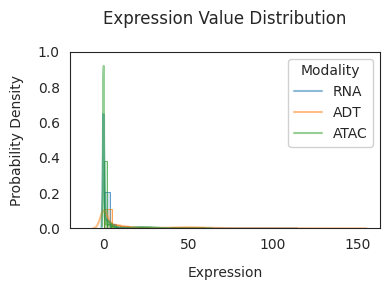

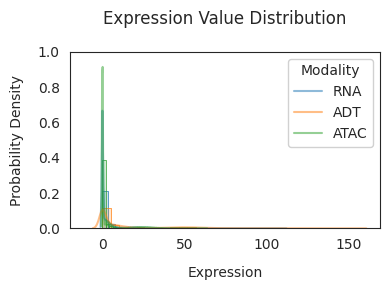

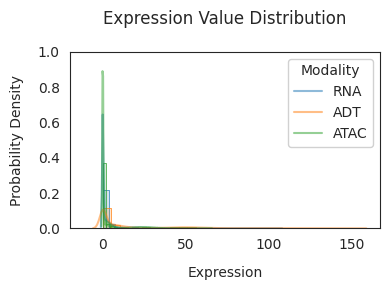

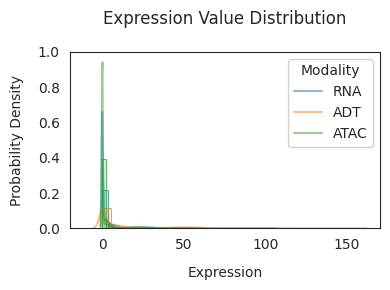

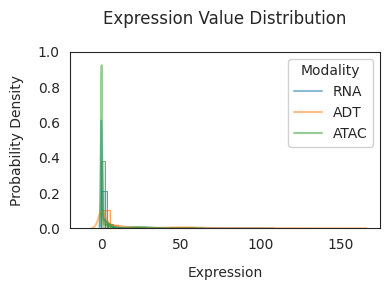

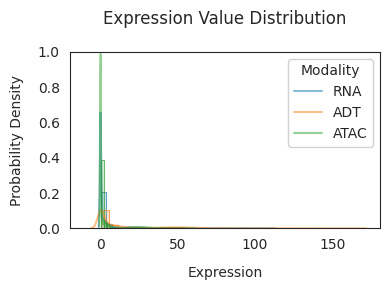

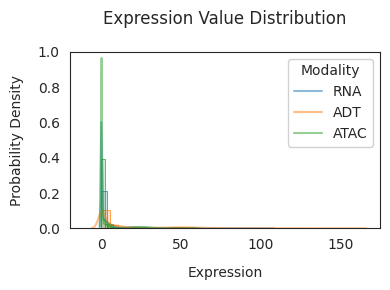

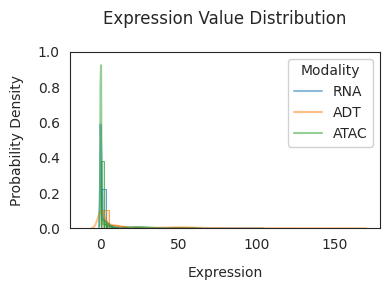

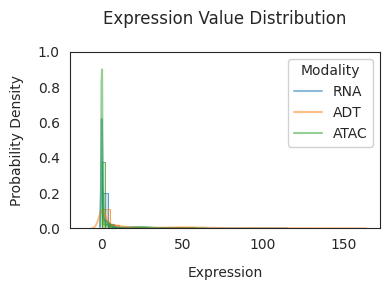

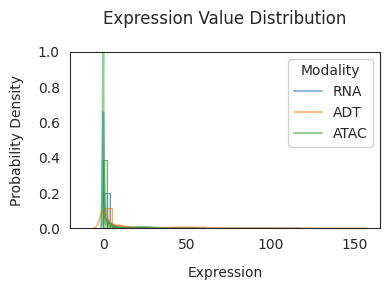

In [3]:
import os
import seaborn as sns
import random
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import anndata

######## Plot single-omic expression distribution

for i in range(10):
    data_path = f"/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics/sim_{i+1}"
    data_name = "sim"

    adata_RNA = sc.read(os.path.join(data_path, f"{data_name}_RNA.h5ad"))
    adata_ADT = sc.read(os.path.join(data_path, f"{data_name}_ADT.h5ad"))
    adata_ATAC = sc.read(os.path.join(data_path, f"{data_name}_ATAC.h5ad"))

    # Create dict to access by name
    adata_dict = {'RNA': adata_RNA, 'ADT': adata_ADT, 'ATAC': adata_ATAC}
    modalities = ['RNA', 'ADT', 'ATAC']

    plt.figure(figsize=(4, 3))
    sns.set_style("white")  # no grid
    palette = ["#1f77b4", "#ff7f0e", "#2ca02c"]

    for j, modality in enumerate(modalities):
        adata = adata_dict[modality]
        
        # Flatten values
        if hasattr(adata.X, "toarray"):
            values = adata.X.toarray().flatten()
        else:
            values = adata.X.flatten()

        sns.kdeplot(values, color=palette[j], linewidth=1.5, label=modality, alpha=0.5) #fill=True, 
        sns.histplot(values, bins=30, color=palette[j], stat='density', alpha=0.2,
                     edgecolor=palette[j], linewidth=0.5)

    plt.ylim(0, 1)
    plt.xlim(left=-20)
    plt.title('Expression Value Distribution', pad=20)
    plt.xlabel('Expression', labelpad=10)
    plt.ylabel('Probability Density', labelpad=10)
    plt.legend(title='Modality', frameon=True, framealpha=0.9)
    plt.grid(False) 
    plt.tight_layout()

    plt.savefig(os.path.join(data_path, f"modality_expr_dist_{i+1}.pdf"), dpi=300)
    plt.show()

8.0
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.05


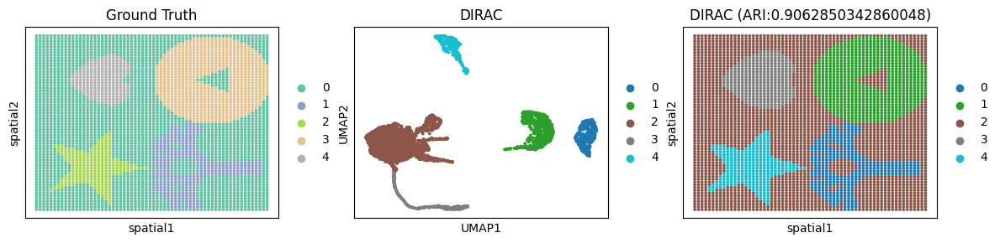

8.0
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.04


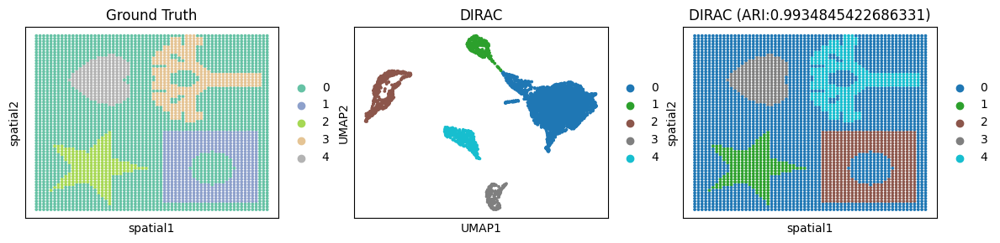

8.0
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.01


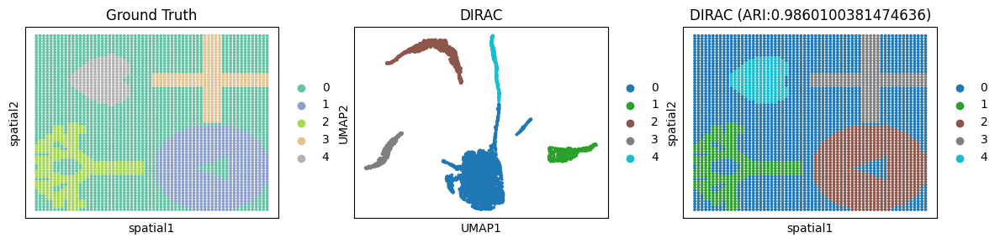

8.0
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.08


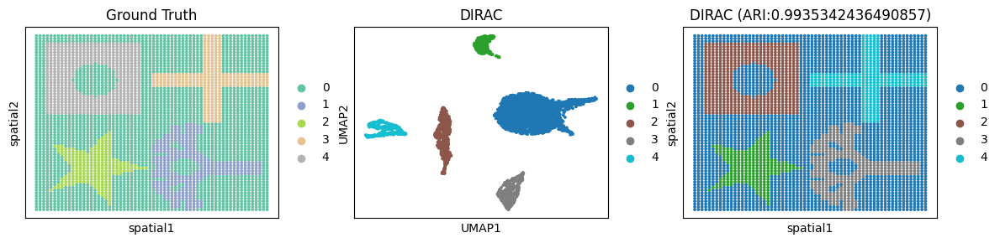

8.0
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.060000000000000005


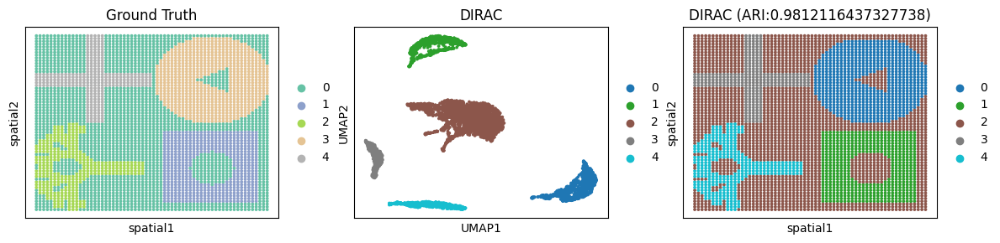

8.0
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.05


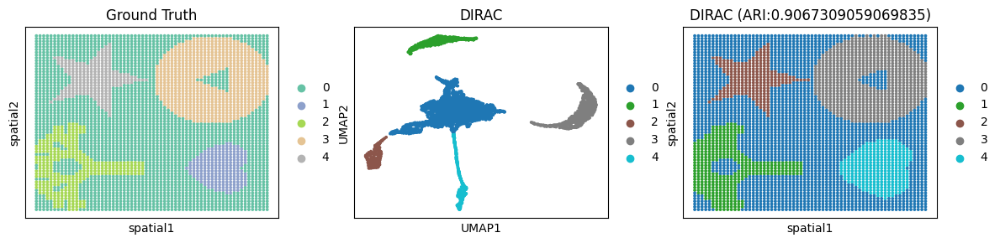

8.0
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.06999999999999999


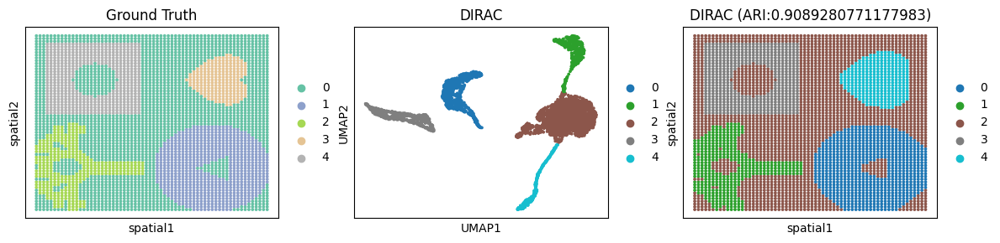

8.0
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.05


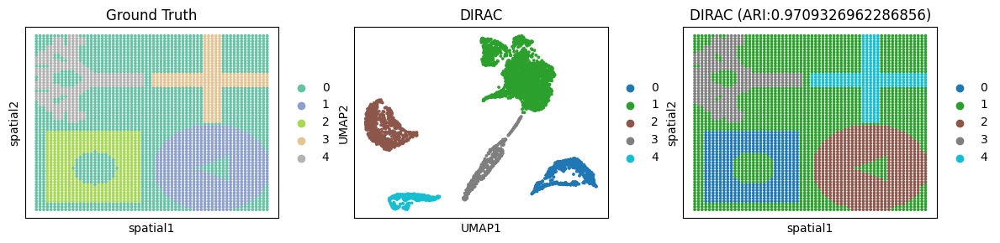

8.0
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.04


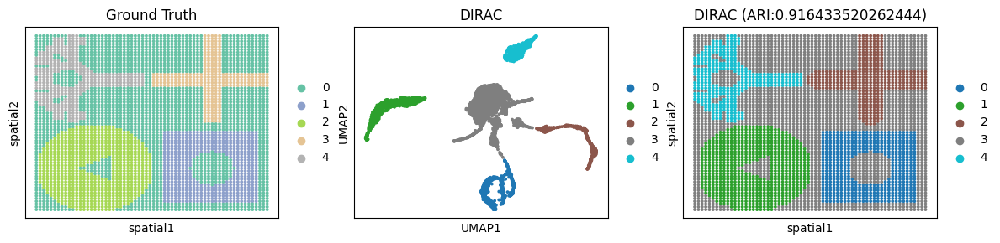

8.0
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.01


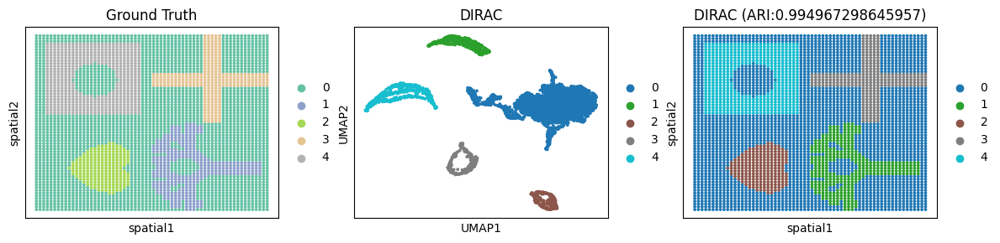

In [1]:
import os
import random

import pandas as pd
import numpy as np
import torch
import scanpy as sc
import matplotlib.pyplot as plt
import anndata
from sklearn.metrics.cluster import adjusted_rand_score
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/DIRAC")
import diracv5 as sd

def seed_torch(seed=1029):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # if you are using multi-GPU.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

seed_torch(seed=8)


for i in range(10):
    data_path = f"/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics_final/sim_{i+1}"
    data_name = "sim"
    methods = "DIRAC"
    out_path = "/home/users/nus/changxu/scratch/DIRAC/Section-2"

    adata_RNA = sc.read(os.path.join(data_path, f"{data_name}_RNA.h5ad"))
    adata_Protein = sc.read(os.path.join(data_path, f"{data_name}_ADT.h5ad"))

    ######### Define colors for spatial multi-omics domain
    colormaps= ["#E41A1C", "#377EB8", "#4DAF4A", "#984EA3", "#FF7F00", "#A65628", "#FFFF33", "#F781BF", "#999999",
            "#E5D8BD", "#B3CDE3", "#CCEBC5", "#FED9A6", "#FBB4AE", "#8DD3C7", "#BEBADA", "#80B1D3", "#B3DE69", "#FCCDE5",
            "#BC80BD", "#FFED6F", "#8DA0CB", "#E78AC3", "#E5C494", "#CCCCCC", "#FB9A99", "#E31A1C", "#CAB2D6","#6A3D9A", 
            "#B15928"]

    ######### Data processing
    adata_RNA.obs["Omics"] = data_name + "_mRNA"
    adata_RNA.obs['Omics'] = adata_RNA.obs['Omics'].astype('category')
    adata_Protein.obs["Omics"] = data_name + "_ADT"
    adata_Protein.obs['Omics'] = adata_Protein.obs['Omics'].astype('category')

    ######### Data processing
    sc.pp.filter_genes(adata_RNA, min_cells=3)
    sc.pp.normalize_total(adata_RNA)
    sc.pp.log1p(adata_RNA)
    sc.pp.scale(adata_RNA)
    sc.tl.pca(adata_RNA, n_comps=50)

    sc.pp.normalize_total(adata_Protein)
    sc.pp.log1p(adata_Protein)
    sc.pp.scale(adata_Protein)

    edge_index = sd.utils.get_single_edge_index(adata_RNA.obsm["spatial"], n_neighbors = 8)
    print(len(edge_index)/adata_RNA.shape[0])
    edge_index = torch.LongTensor(edge_index).T

    save_path = os.path.join(out_path, "Results", f"{data_name}_{i+1}_{methods}")
    if not os.path.exists(save_path):
        os.makedirs(save_path)


    ###### Training Dirac for spatial multi-omics
    dirac = sd.main.integrate_app(save_path = save_path, 
                                  use_gpu = True, 
                                  subgraph = False)
    samples = dirac._get_data(dataset_list = [adata_RNA.obsm['X_pca'].copy(), adata_Protein.X.copy()],
                            domain_list = [np.zeros(adata_RNA.shape[0]), np.ones(adata_Protein.shape[0])],
                            edge_index = edge_index,
                             )
    models = dirac._get_model(samples,
                            n_hiddens = 128,
                            n_outputs = 64,
                            opt_GNN = "GAT")
    data_z, combine_recon = dirac._train_dirac_integrate(samples = samples,
                                            models = models,
                                            epochs = 200,
                                            lamb = 5e-4,
                                            scale_loss = 0.025,
                                            lr = 1e-3,
                                            wd = 5e-2)


    adata_RNA.obsm[f"{methods}_embed"] = data_z[: adata_RNA.shape[0], :]
    adata_Protein.obsm[f"{methods}_embed"] = data_z[adata_RNA.shape[0] :, :]
    adata_RNA.obsm["combine_recon"] = combine_recon
    adata_Protein.obsm["combine_recon"] = combine_recon

    n_clusters = 5
    fig, ax_list = plt.subplots(1, 3, figsize=(12, 3))
    sc.pp.neighbors(adata_RNA, use_rep='combine_recon', n_neighbors=30)
    res = sd.utils._priori_cluster(adata_RNA, eval_cluster_n = n_clusters)
    sc.tl.leiden(adata_RNA, resolution = res, key_added="DIRAC", flavor="igraph", n_iterations=2, directed=False)
    sc.tl.umap(adata_RNA)
    ARI = float(adjusted_rand_score(adata_RNA.obs['DIRAC'], adata_RNA.obs['ground_truth']))

    sc.pl.embedding(adata_RNA, basis='spatial', color='ground_truth', ax=ax_list[0],\
                    title='Ground Truth', s=30, show=False, palette="Set2")
    sc.pl.umap(adata_RNA, color='DIRAC', ax=ax_list[1], title='DIRAC', s=30,\
               show=False, palette="tab10")
    sc.pl.embedding(adata_RNA, basis='spatial', color='DIRAC', ax=ax_list[2],\
                    title=f'DIRAC (ARI:{ARI})', s=30, show=False, palette="tab10")

    plt.tight_layout(w_pad=0.3)
    plt.savefig(os.path.join(save_path, f"{data_name}_{i+1}_{methods}.pdf"), dpi=300)
    plt.show()
    
    adata_RNA.obs['DIRAC'].to_csv(os.path.join(save_path, f"{data_name}_{i+1}_DIRAC.csv"))
    pd.DataFrame(adata_RNA.obsm["combine_recon"], index=adata_RNA.obs_names).to_csv(os.path.join(save_path, f"{data_name}_{i+1}_{methods}_combine.csv"))
    pd.DataFrame(adata_RNA.obsm[f"{methods}_embed"], index=adata_RNA.obs_names).to_csv(os.path.join(save_path, f"{data_name}_{i+1}_{methods}_RNA.csv"))
    pd.DataFrame(adata_Protein.obsm[f"{methods}_embed"], index=adata_Protein.obs_names).to_csv(os.path.join(save_path, f"{data_name}_{i+1}_{methods}_ADT.csv")) 

8.0
Found 3 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.05


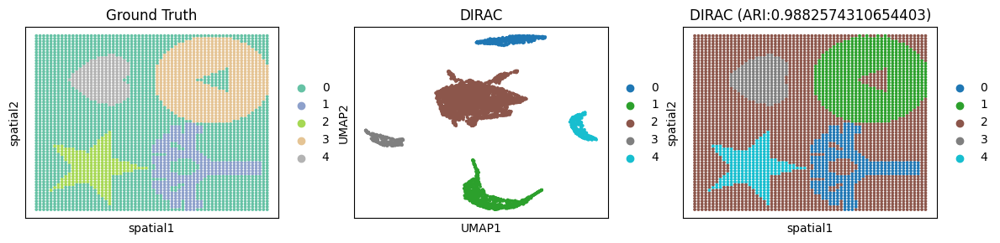

8.0
Found 3 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.08


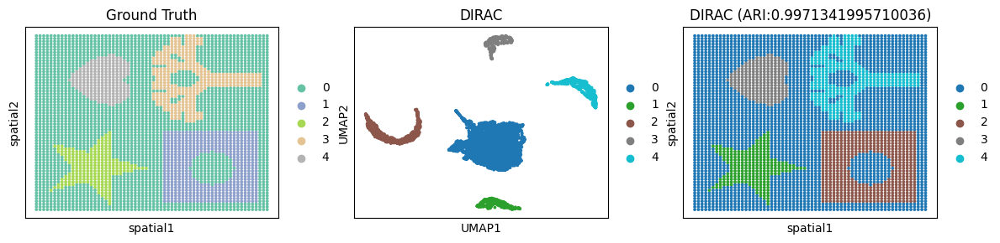

8.0
Found 3 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.09999999999999999


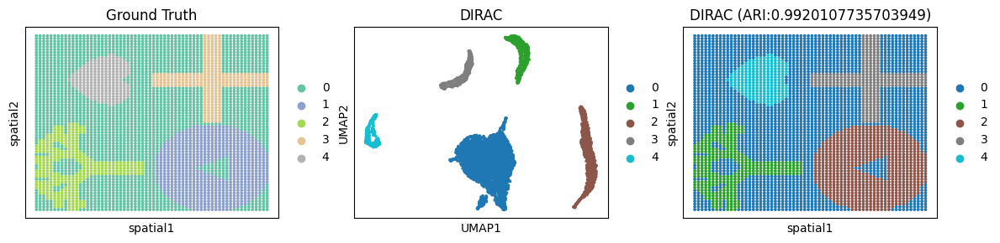

8.0
Found 3 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.060000000000000005


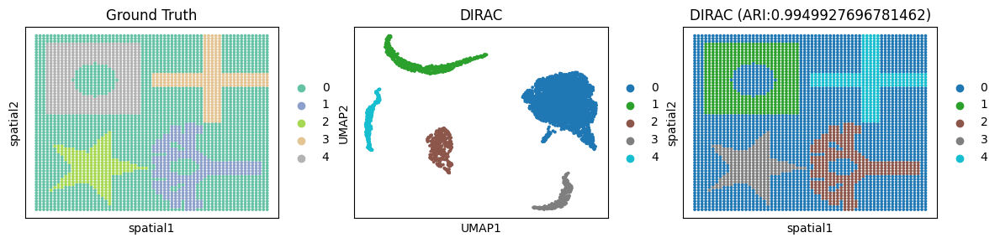

8.0
Found 3 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.06999999999999999


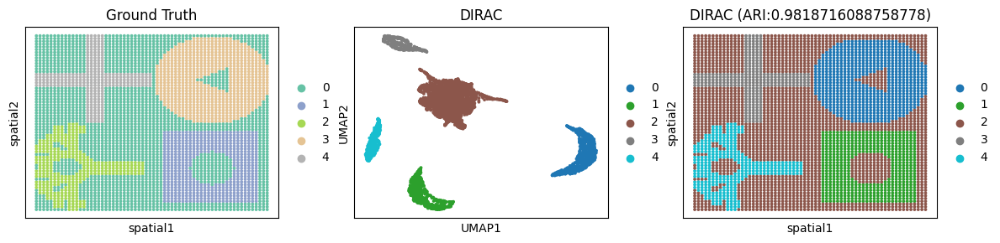

8.0
Found 3 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.08


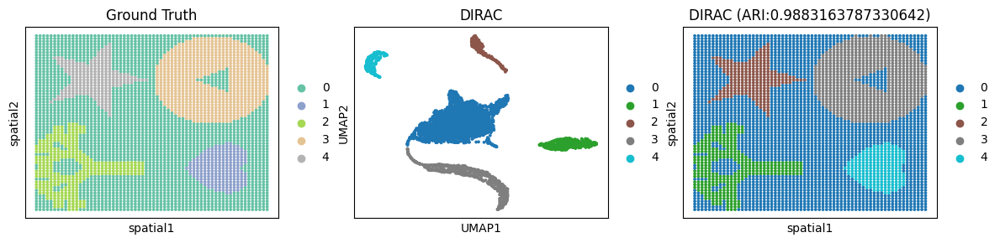

8.0
Found 3 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.13


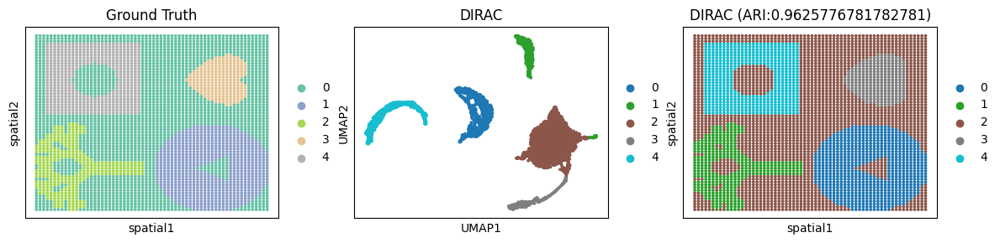

8.0
Found 3 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.09999999999999999


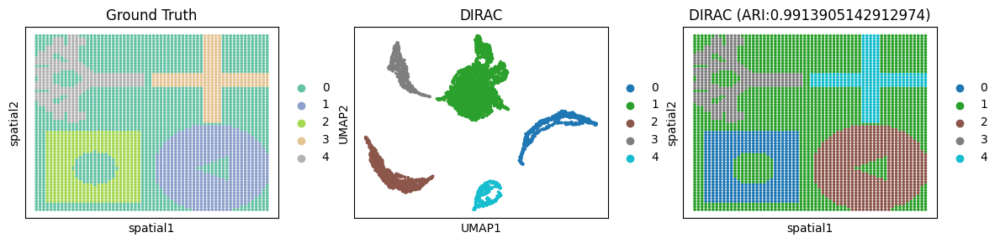

8.0
Found 3 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.08


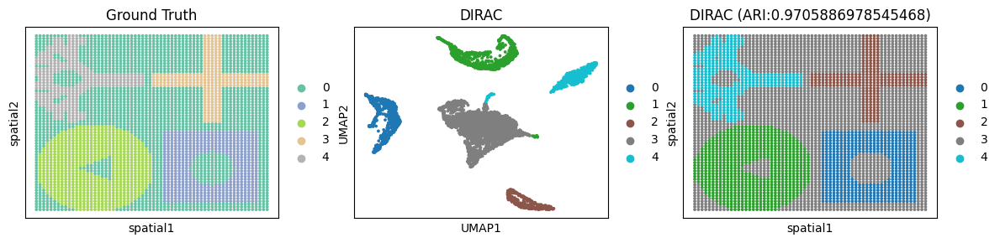

8.0
Found 3 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


Best resolution:  0.14


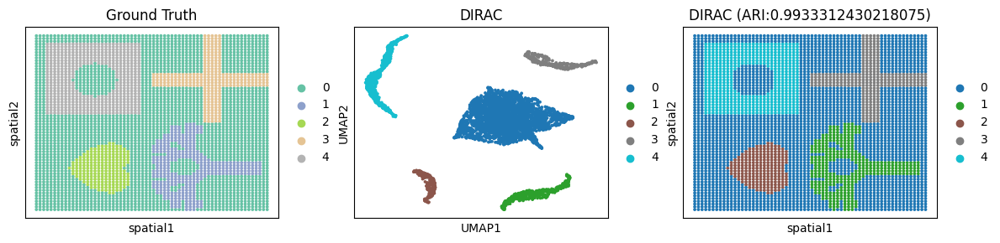

In [2]:
import os
import random

import pandas as pd
import numpy as np
import torch
import scanpy as sc
import matplotlib.pyplot as plt
import anndata
from sklearn.metrics.cluster import adjusted_rand_score
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/DIRAC")
import diracv5 as sd

def seed_torch(seed=1029):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # if you are using multi-GPU.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

seed_torch(seed=6)


for i in range(10):
    data_path = f"/home/project/11003054/changxu/Projects/DIRAC/Section-2/simulations/sp_multi_omics_final/sim_{i+1}"
    data_name = "sim"
    methods = "DIRAC"
    out_path = "/home/users/nus/changxu/scratch/DIRAC/Section-2"

    adata_RNA = sc.read(os.path.join(data_path, f"{data_name}_RNA.h5ad"))
    adata_Protein = sc.read(os.path.join(data_path, f"{data_name}_ADT.h5ad"))
    adata_ATAC = sc.read(os.path.join(data_path, f"{data_name}_ATAC.h5ad"))

    ######### Define colors for spatial multi-omics domain
    colormaps= ["#E41A1C", "#377EB8", "#4DAF4A", "#984EA3", "#FF7F00", "#A65628", "#FFFF33", "#F781BF", "#999999",
            "#E5D8BD", "#B3CDE3", "#CCEBC5", "#FED9A6", "#FBB4AE", "#8DD3C7", "#BEBADA", "#80B1D3", "#B3DE69", "#FCCDE5",
            "#BC80BD", "#FFED6F", "#8DA0CB", "#E78AC3", "#E5C494", "#CCCCCC", "#FB9A99", "#E31A1C", "#CAB2D6","#6A3D9A", 
            "#B15928"]

    ######### Data processing
    adata_RNA.obs["Omics"] = data_name + "_mRNA"
    adata_RNA.obs['Omics'] = adata_RNA.obs['Omics'].astype('category')
    adata_Protein.obs["Omics"] = data_name + "_ADT"
    adata_Protein.obs['Omics'] = adata_Protein.obs['Omics'].astype('category')
    adata_ATAC.obs["Omics"] = data_name + "_ATAC"
    adata_ATAC.obs['Omics'] = adata_ATAC.obs['Omics'].astype('category')


    ######### Data processing
    sc.pp.filter_genes(adata_RNA, min_cells=3)
    sc.pp.normalize_total(adata_RNA)
    sc.pp.log1p(adata_RNA)
    sc.pp.scale(adata_RNA)
    sc.tl.pca(adata_RNA, n_comps=50)

    sc.pp.normalize_total(adata_Protein)
    sc.pp.log1p(adata_Protein)
    sc.pp.scale(adata_Protein)

    sc.pp.filter_genes(adata_ATAC, min_cells=10)
    sd.utils.lsi(adata_ATAC, n_comps=100)

    edge_index = sd.utils.get_single_edge_index(adata_RNA.obsm["spatial"], n_neighbors = 8)
    print(len(edge_index)/adata_RNA.shape[0])
    edge_index = torch.LongTensor(edge_index).T

    save_path = os.path.join(out_path, "Results", f"{data_name}_{i+1}_{methods}")
    if not os.path.exists(save_path):
        os.makedirs(save_path)


    ###### Training Dirac for spatial multi-omics
    dirac = sd.main.integrate_app(save_path = save_path, 
                                  use_gpu = True, 
                                  subgraph = False)
    samples = dirac._get_data(dataset_list = [adata_RNA.obsm['X_pca'].copy(), adata_Protein.X.copy(), adata_ATAC.obsm['X_lsi'].copy()],
                            domain_list = [np.zeros(adata_RNA.shape[0]), np.ones(adata_Protein.shape[0]), np.ones(adata_ATAC.shape[0])+1],
                            edge_index = edge_index,
                             )
    models = dirac._get_model(samples,
                            n_hiddens = 128,
                            n_outputs = 64,
                            opt_GNN = "GAT")
    data_z, combine_recon  = dirac._train_dirac_integrate(samples = samples,
                                            models = models,
                                            epochs = 200,
                                            lamb = 5e-4,
                                            scale_loss = 0.025,
                                            lr = 1e-3,
                                            wd = 5e-2)

    adata_RNA.obsm[f"{methods}_embed"] = data_z[: adata_RNA.shape[0], :]
    adata_Protein.obsm[f"{methods}_embed"] = data_z[adata_RNA.shape[0] : adata_RNA.shape[0]*2, :]
    adata_ATAC.obsm[f"{methods}_embed"] = data_z[adata_RNA.shape[0]*2 :,:]

    adata_RNA.obsm["combine_recon"] = combine_recon
    n_clusters = 5
    fig, ax_list = plt.subplots(1, 3, figsize=(12, 3))
    sc.pp.neighbors(adata_RNA, use_rep='combine_recon', n_neighbors=30) 
    res = sd.utils._priori_cluster(adata_RNA, eval_cluster_n = n_clusters)
    sc.tl.leiden(adata_RNA, resolution = res, key_added="DIRAC", flavor="igraph", n_iterations=2, directed=False)
    sc.tl.umap(adata_RNA)
    ARI = float(adjusted_rand_score(adata_RNA.obs['DIRAC'], adata_RNA.obs['ground_truth']))

    sc.pl.embedding(adata_RNA, basis='spatial', color='ground_truth', ax=ax_list[0],\
                    title='Ground Truth', s=30, show=False, palette="Set2")
    sc.pl.umap(adata_RNA, color='DIRAC', ax=ax_list[1], title='DIRAC', s=30,\
               show=False, palette="tab10")
    sc.pl.embedding(adata_RNA, basis='spatial', color='DIRAC', ax=ax_list[2],\
                    title=f'DIRAC (ARI:{ARI})', s=30, show=False, palette="tab10")

    plt.tight_layout(w_pad=0.3)
    plt.savefig(os.path.join(save_path, f"{data_name}_{i+1}_{methods}_3M.pdf"), dpi=300)
    plt.show()
    
    adata_RNA.obs['DIRAC'].to_csv(os.path.join(save_path, f"{data_name}_{i+1}_{methods}_3M.csv"))
    pd.DataFrame(adata_RNA.obsm["combine_recon"], index=adata_RNA.obs_names).to_csv(os.path.join(save_path, f"{data_name}_{i+1}_{methods}_combine_3M.csv"))
    pd.DataFrame(adata_RNA.obsm[f"{methods}_embed"], index=adata_RNA.obs_names).to_csv(os.path.join(save_path, f"{data_name}_{i+1}_{methods}_RNA_3M.csv"))
    pd.DataFrame(adata_Protein.obsm[f"{methods}_embed"], index=adata_Protein.obs_names).to_csv(os.path.join(save_path, f"{data_name}_{i+1}_{methods}_ADT_3M.csv"))
    pd.DataFrame(adata_ATAC.obsm[f"{methods}_embed"], index=adata_ATAC.obs_names).to_csv(os.path.join(save_path, f"{data_name}_{i+1}_{methods}_ATAC_3M.csv"))

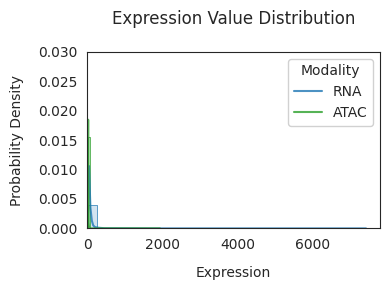

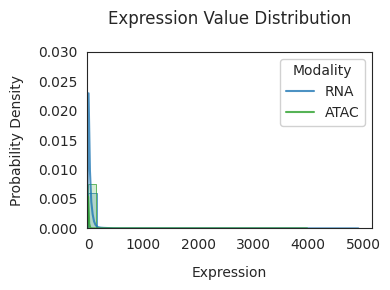

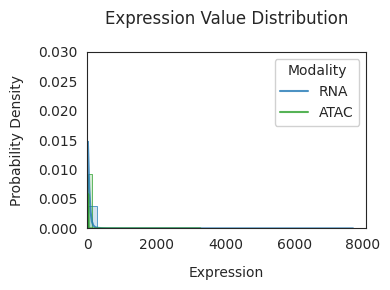

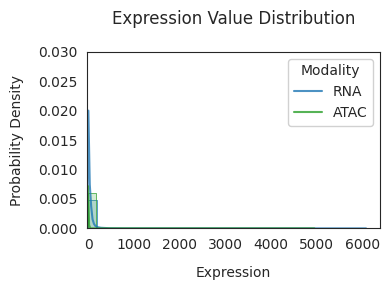

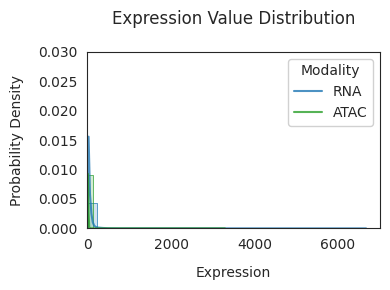

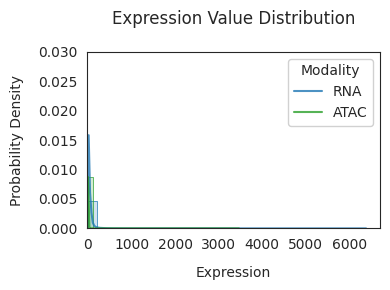

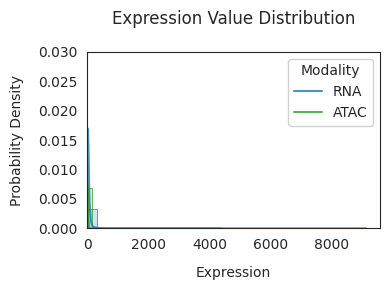

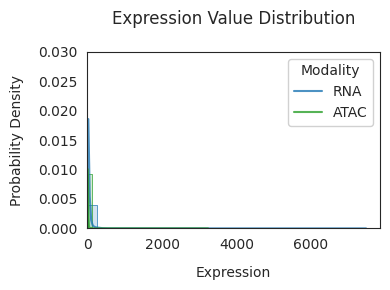

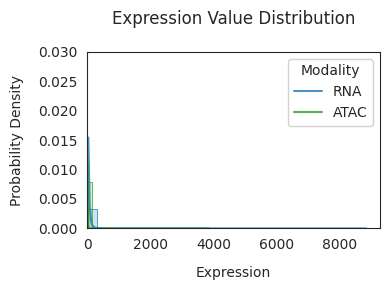

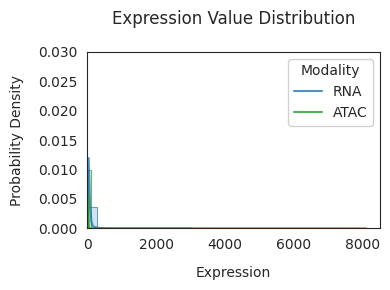

In [1]:
import os
import seaborn as sns
import random
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import anndata

import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

######## Plot single-omic expression distribution

for i in range(10):
    data_path = f"/home/project/11003054/changxu/Projects/DIRAC/Section-2/scMultiSim_data/sim_{i+1}"
    data_name = "sim"

    adata_RNA = sc.read(os.path.join(data_path, f"{data_name}_RNA.h5ad"))
    adata_ATAC = sc.read(os.path.join(data_path, f"{data_name}_ATAC.h5ad"))

    # Create dict to access by name
    adata_dict = {'RNA': adata_RNA, 'ATAC': adata_ATAC}
    modalities = ['RNA', 'ATAC']

    plt.figure(figsize=(4, 3))
    sns.set_style("white")  # no grid
    palette = ["#1f77b4", "#2ca02c", "#ff7f0e"]

    for j, modality in enumerate(modalities):
        adata = adata_dict[modality]
        
        # Flatten values
        if hasattr(adata.X, "toarray"):
            values = adata.X.toarray().flatten()
        else:
            values = adata.X.flatten()

        sns.kdeplot(values, color=palette[j], linewidth=1.5, label=modality, alpha=0.8) #fill=True, 
        sns.histplot(values, bins=30, color=palette[j], stat='density', alpha=0.2,
                     edgecolor=palette[j], linewidth=0.5)

    plt.ylim(0, 0.03)
    plt.xlim(left=-20)
    plt.title('Expression Value Distribution', pad=20)
    plt.xlabel('Expression', labelpad=10)
    plt.ylabel('Probability Density', labelpad=10)
    plt.legend(title='Modality', frameon=True, framealpha=0.9)
    plt.grid(False) 
    plt.tight_layout()

    plt.savefig(os.path.join(data_path, f"modality_expr_dist_{i+1}.pdf"), dpi=300)
    plt.show()

5.868
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


fitting ...
  |======================================================================| 100%


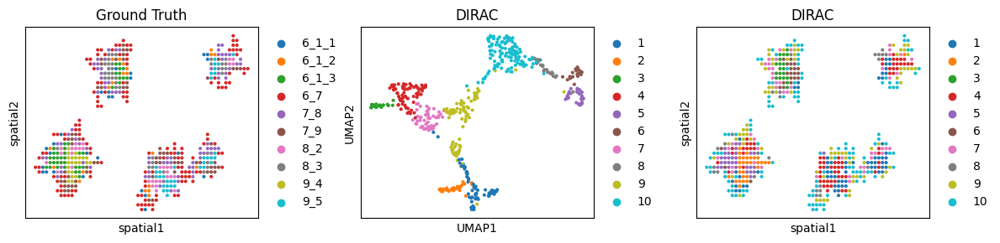

6.4
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


fitting ...
  |======================================================================| 100%


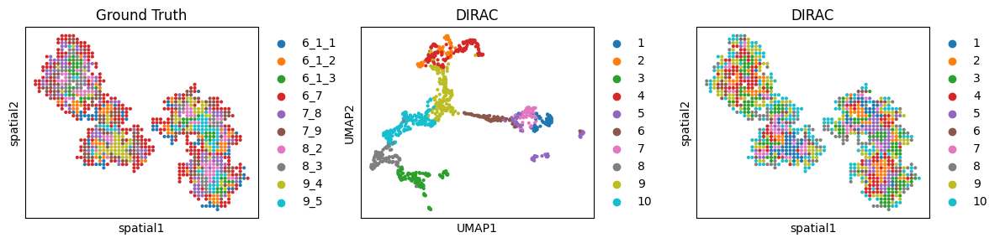

5.8453333333333335
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


fitting ...
  |======================================================================| 100%


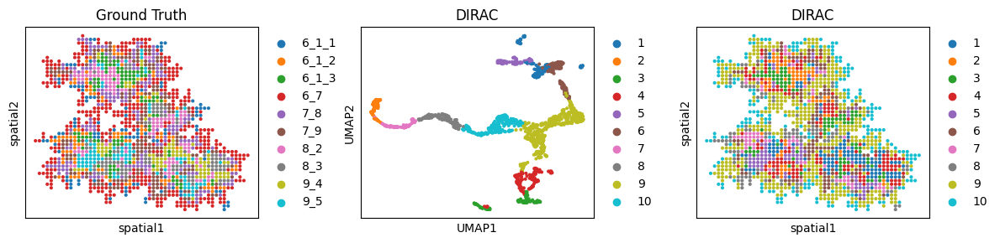

6.194
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


fitting ...
  |======================================================================| 100%


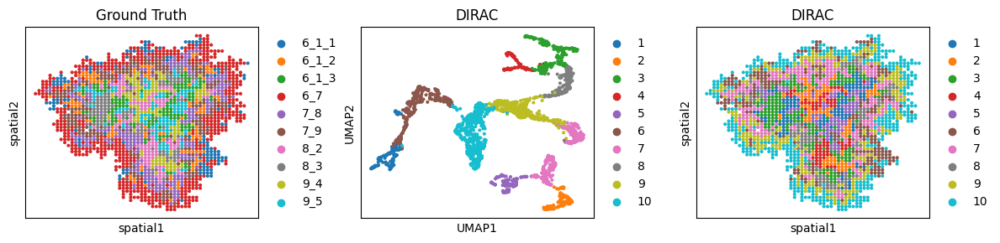

5.6772
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


fitting ...
  |======================================================================| 100%


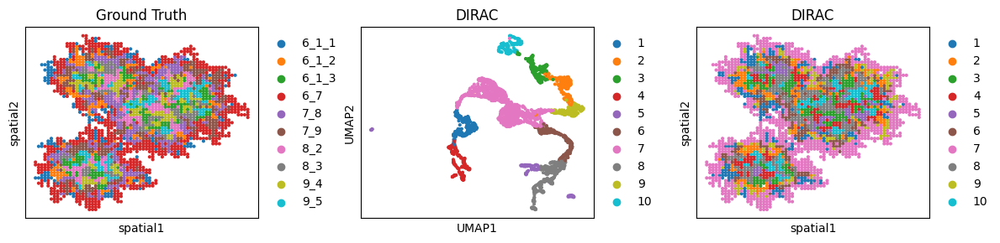

5.566333333333334
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


fitting ...
  |======================================================================| 100%


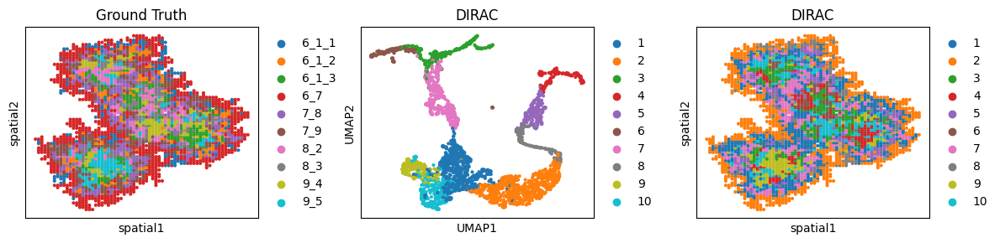

5.501142857142857
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


fitting ...
  |======================================================================| 100%


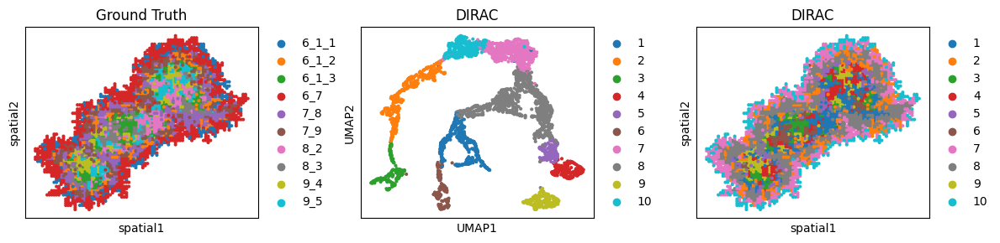

4.82325
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


fitting ...
  |======================================================================| 100%


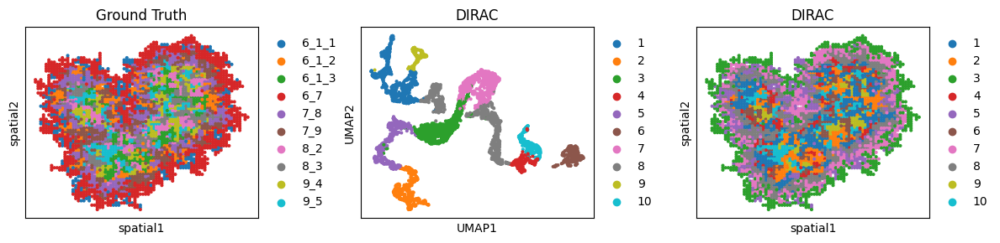

4.668222222222222
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


fitting ...
  |======================================================================| 100%


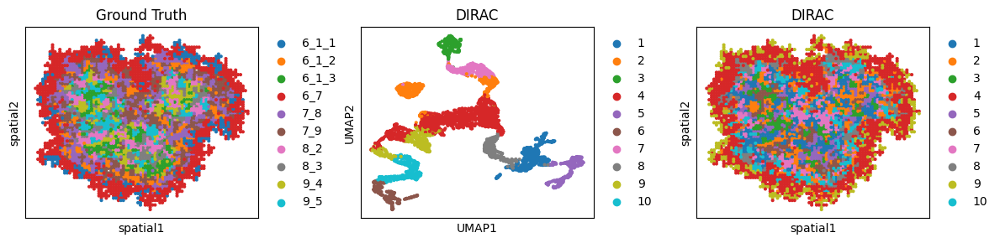

4.6486
Found 2 unique domains.


DIRAC integrate..: 100%|█| 200/200 [00


fitting ...
  |======================================================================| 100%


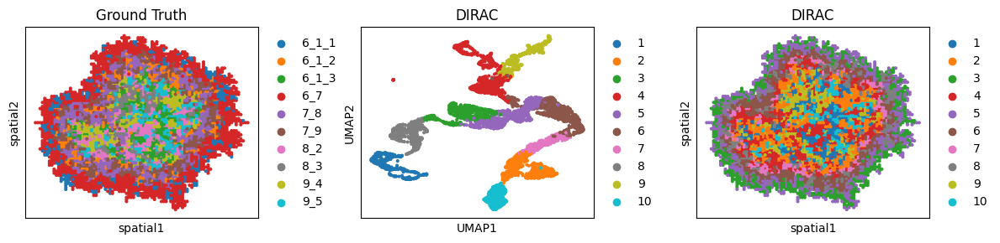

In [4]:
import os
import random

import pandas as pd
import numpy as np
import torch
import scanpy as sc
import matplotlib.pyplot as plt
import anndata
from scipy.sparse import csr_matrix

import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/DIRAC")
import diracv5 as sd

def seed_torch(seed=1029):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    # if you are using multi-GPU.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

seed_torch(seed=0)

for i in range(10):
    data_path = f"/home/project/11003054/changxu/Projects/DIRAC/Section-2/scMultiSim_data/sim_{i+1}"
    data_name = "sim"
    methods = "DIRAC"
    out_path = "/home/users/nus/changxu/scratch/DIRAC/Section-2"

    adata_RNA = sc.read(os.path.join(data_path, f"{data_name}_RNA.h5ad"))
    adata_ATAC = sc.read(os.path.join(data_path, f"{data_name}_ATAC.h5ad"))

    ######### Data processing
    adata_RNA.obs["Omics"] = data_name + "_mRNA"
    adata_RNA.obs['Omics'] = adata_RNA.obs['Omics'].astype('category')
    adata_ATAC.obs["Omics"] = data_name + "_ATAC"
    adata_ATAC.obs['Omics'] = adata_ATAC.obs['Omics'].astype('category')

    ######### Data processing
    sc.pp.normalize_total(adata_RNA)
    sc.pp.log1p(adata_RNA)
    sc.pp.scale(adata_RNA)
    sc.tl.pca(adata_RNA, n_comps=20)

    sc.pp.filter_genes(adata_ATAC, min_cells=3)
    sd.utils.lsi(adata_ATAC, n_comps=30)
    edge_index = sd.utils.get_consensus_edges(adata_RNA.obsm["spatial"], adata_RNA.obsm["X_pca"], adata_ATAC.obsm["X_lsi"], target_neighbors=6)
    print(edge_index.shape[1] / adata_RNA.shape[0])

    save_path = os.path.join(out_path, "Results", f"{data_name}_{i+1}_scMultiSim_{methods}")
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    ###### Training Dirac for spatial multi-omics
    dirac = sd.main.integrate_app(save_path = save_path, 
                                  use_gpu = True, 
                                  subgraph = False)
    samples = dirac._get_data(dataset_list = [adata_RNA.obsm['X_pca'].copy(), adata_ATAC.obsm['X_lsi'].copy()],
                            domain_list = [np.zeros(adata_RNA.shape[0]), np.ones(adata_ATAC.shape[0])],
                            edge_index = edge_index,
                             )
    models = dirac._get_model(samples,
                            n_hiddens = 32,
                            n_outputs = 10,
                            opt_GNN = "GAT",)
    data_z, combine_recon = dirac._train_dirac_integrate(samples = samples,
                                            models = models,
                                            epochs = 200,
                                            lamb = 5e-4,
                                            scale_loss = 0.025,
                                            lr = 1e-3,
                                            wd = 5e-2)


    adata_RNA.obsm[f"{methods}_embed"] = data_z[: adata_RNA.shape[0], :]
    adata_ATAC.obsm[f"{methods}_embed"] = data_z[adata_RNA.shape[0] :, :]
    adata_RNA.obsm["combine_recon"] = combine_recon
    adata_ATAC.obsm["combine_recon"] = combine_recon

    n_clusters = len(adata_RNA.obs['cell.type'].unique())
    fig, ax_list = plt.subplots(1, 3, figsize=(12, 3))
    sc.pp.neighbors(adata_RNA, use_rep='combine_recon', metric="cosine")
    sd.utils.mclust_R(adata = adata_RNA, num_cluster = n_clusters, used_obsm="combine_recon", key_added="DIRAC")

    sc.tl.umap(adata_RNA)
    sc.pl.embedding(adata_RNA, basis='spatial', color='cell.type', ax=ax_list[0],\
                    title='Ground Truth', s=35, show=False, palette="tab10")
    sc.pl.umap(adata_RNA, color='DIRAC', ax=ax_list[1], title='DIRAC', s=35,\
               show=False, palette="tab10")
    sc.pl.embedding(adata_RNA, basis='spatial', color='DIRAC', ax=ax_list[2],\
                    title='DIRAC', s=35, show=False, palette="tab10")

    plt.tight_layout(w_pad=0.3)
    plt.savefig(os.path.join(save_path, f"{data_name}_{i+1}_{methods}.pdf"), dpi=300)
    plt.show()
    
    # adata_RNA.obs['DIRAC'].to_csv(os.path.join(save_path, f"{data_name}_{i+1}_DIRAC.csv"))
    pd.DataFrame(adata_RNA.obsm["combine_recon"], index=adata_RNA.obs_names).to_csv(os.path.join(save_path, f"{data_name}_{i+1}_{methods}_combine.csv"))
    pd.DataFrame(adata_RNA.obsm[f"{methods}_embed"], index=adata_RNA.obs_names).to_csv(os.path.join(save_path, f"{data_name}_{i+1}_{methods}_RNA.csv"))
    pd.DataFrame(adata_ATAC.obsm[f"{methods}_embed"], index=adata_ATAC.obs_names).to_csv(os.path.join(save_path, f"{data_name}_{i+1}_{methods}_ADT.csv")) 